#Neuron Combinations
Code to programmatically combine neuron visualization using Lucid Objectives
Runs on Google Colab

In [ ]:
%tensorflow_version 1.x

TensorFlow 1.x selected.


In [ ]:
# Load the Drive helper and mount
from google.colab import drive

# This will prompt for authorization.
drive.mount('/content/drive')

Mounted at /content/drive


In [ ]:
!pip install --quiet lucid==0.3.8

import numpy as np
import tensorflow as tf

import lucid.modelzoo.vision_models as models
from lucid.misc.io import show
from lucid.misc.io import saving
import lucid.optvis.objectives as objectives
import lucid.optvis.param as param
import lucid.optvis.render as render
import lucid.optvis.transform as transform
from lucid.misc.channel_reducer import ChannelReducer
import sys

from lucid.misc.io import show, load

In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


In [ ]:
from lucid.modelzoo.vision_base import Model

Converted version of facenet may be linked with google drive or manually uploaded: **facenet_converted.pb**

In [ ]:
class FaceNet(Model):
  model_path = '/content/facenet_converted.pb'
  image_shape = [160, 160, 3]
  image_value_range = (0, 1)
  input_name = 'input'


facenet = FaceNet()
facenet.load_graphdef()


In [ ]:
for node in facenet.graph_def.node:
  if 'Concat' in node.op:
    print(node.name)

InceptionResnetV1/Repeat/block35_1/concat
InceptionResnetV1/Repeat/block35_2/concat
InceptionResnetV1/Repeat/block35_3/concat
InceptionResnetV1/Repeat/block35_4/concat
InceptionResnetV1/Repeat/block35_5/concat
InceptionResnetV1/Mixed_6a/concat
InceptionResnetV1/Repeat_1/block17_1/concat
InceptionResnetV1/Repeat_1/block17_2/concat
InceptionResnetV1/Repeat_1/block17_3/concat
InceptionResnetV1/Repeat_1/block17_4/concat
InceptionResnetV1/Repeat_1/block17_5/concat
InceptionResnetV1/Repeat_1/block17_6/concat
InceptionResnetV1/Repeat_1/block17_7/concat
InceptionResnetV1/Repeat_1/block17_8/concat
InceptionResnetV1/Repeat_1/block17_9/concat
InceptionResnetV1/Repeat_1/block17_10/concat
InceptionResnetV1/Mixed_7a/concat
InceptionResnetV1/Repeat_2/block8_1/concat
InceptionResnetV1/Repeat_2/block8_2/concat
InceptionResnetV1/Repeat_2/block8_3/concat
InceptionResnetV1/Repeat_2/block8_4/concat
InceptionResnetV1/Repeat_2/block8_5/concat
InceptionResnetV1/Block8/concat


In [ ]:
# InceptionResnetV1/Repeat/block35_1/concat
# InceptionResnetV1/Repeat/block35_2/concat
# InceptionResnetV1/Repeat/block35_3/concat
# InceptionResnetV1/Repeat/block35_4/concat
# InceptionResnetV1/Repeat/block35_5/concat
# InceptionResnetV1/Mixed_6a/concat
# InceptionResnetV1/Repeat_1/block17_1/concat
# InceptionResnetV1/Repeat_1/block17_2/concat
# InceptionResnetV1/Repeat_1/block17_3/concat
# InceptionResnetV1/Repeat_1/block17_4/concat
# InceptionResnetV1/Repeat_1/block17_5/concat
# InceptionResnetV1/Repeat_1/block17_6/concat
# InceptionResnetV1/Repeat_1/block17_7/concat
# InceptionResnetV1/Repeat_1/block17_8/concat
# InceptionResnetV1/Repeat_1/block17_9/concat
# InceptionResnetV1/Repeat_1/block17_10/concat
# InceptionResnetV1/Mixed_7a/concat
# InceptionResnetV1/Repeat_2/block8_1/concat
# InceptionResnetV1/Repeat_2/block8_2/concat
# InceptionResnetV1/Repeat_2/block8_3/concat
# InceptionResnetV1/Repeat_2/block8_4/concat
# InceptionResnetV1/Repeat_2/block8_5/concat
# InceptionResnetV1/Block8/concat

InceptionResnetV1/Repeat/block35_1/concat
InceptionResnetV1/Repeat/block35_2/concat
InceptionResnetV1/Repeat/block35_3/concat
InceptionResnetV1/Repeat/block35_4/concat
InceptionResnetV1/Repeat/block35_5/concat
InceptionResnetV1/Mixed_6a/concat
InceptionResnetV1/Repeat_1/block17_1/concat
InceptionResnetV1/Repeat_1/block17_2/concat
InceptionResnetV1/Repeat_1/block17_3/concat
InceptionResnetV1/Repeat_1/block17_4/concat
InceptionResnetV1/Repeat_1/block17_5/concat
InceptionResnetV1/Repeat_1/block17_6/concat
InceptionResnetV1/Repeat_1/block17_7/concat
InceptionResnetV1/Repeat_1/block17_8/concat
InceptionResnetV1/Repeat_1/block17_9/concat
InceptionResnetV1/Repeat_1/block17_10/concat
InceptionResnetV1/Mixed_7a/concat
InceptionResnetV1/Repeat_2/block8_1/concat
InceptionResnetV1/Repeat_2/block8_2/concat
InceptionResnetV1/Repeat_2/block8_3/concat
InceptionResnetV1/Repeat_2/block8_4/concat
InceptionResnetV1/Repeat_2/block8_5/concat
InceptionResnetV1/Block8/concat

The TensorFlow contrib module will not be included in TensorFlow 2.0.
For more information, please see:
  * https://github.com/tensorflow/community/blob/master/rfcs/20180907-contrib-sunset.md
  * https://github.com/tensorflow/addons
  * https://github.com/tensorflow/io (for I/O related ops)
If you depend on functionality not listed there, please file an issue.



The TensorFlow contrib module will not be included in TensorFlow 2.0.
For more information, please see:
  * https://github.com/tensorflow/community/blob/master/rfcs/20180907-contrib-sunset.md
  * https://github.com/tensorflow/addons
  * https://github.com/tensorflow/io (for I/O related ops)
If you depend on functionality not listed there, please file an issue.



Instructions for updating:
Use tf.where in 2.0, which has the same broadcast rule as np.where


Instructions for updating:
Use tf.where in 2.0, which has the same broadcast rule as np.where


512 10.167263



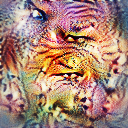

In [ ]:
#Basic code for rendering a single neuron find cool neurons by searching them
_ = render.render_vis(facenet, "InceptionResnetV1/Block8/concat:0")

0
512 9.989732



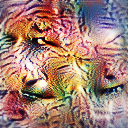

1
512 10.3581085



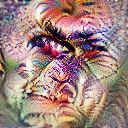

2
512 7.513996



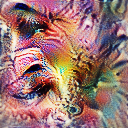

In [ ]:
#loop you can use to search through the different neurons
for i in range(3):
  print(i)
  strinh = "InceptionResnetV1/Block8/concat:" + str(i)
  _ = render.render_vis(facenet, strinh)

replace the neurons in the neuron list with cool looking ones that have facial features in them

In [ ]:
neuronlist =  [
               ('InceptionResnetV1/Mixed_6a/concat', 17),
               ('InceptionResnetV1/Mixed_6a/concat', 29) ,
               ('InceptionResnetV1/Mixed_6a/concat', 31) ,
               ('InceptionResnetV1/Mixed_6a/concat', 43) ,
               ('InceptionResnetV1/Mixed_7a/concat', 0) ,
               ('InceptionResnetV1/Mixed_7a/concat', 2) ,
               ('InceptionResnetV1/Mixed_7a/concat', 22) ,
               ('InceptionResnetV1/Mixed_7a/concat', 40) ,
               ('InceptionResnetV1/Repeat_2/block8_1/concat', 15) ,
               ('InceptionResnetV1/Repeat_2/block8_1/concat', 21) ,
               ('InceptionResnetV1/Repeat_2/block8_1/concat', 25) ,
               ('InceptionResnetV1/Repeat_2/block8_1/concat', 39) ,
               ('InceptionResnetV1/Block8/concat', 19) ,
               ('InceptionResnetV1/Block8/concat', 23),
               ('InceptionResnetV1/Block8/concat', 26),
               ('InceptionResnetV1/Block8/concat', 41)]
# neuron1 = ('mixed3a_pre_relu', 139)   # pointilist
# neuron1 = ('mixed3b_pre_relu',  81)   # brush trokes
# neuron1 = ('mixed4a_pre_relu',  97)   # wavy
# neuron1 = ('mixed4a_pre_relu',  41)   # frames
# neuron1 = ('mixed4a_pre_relu', 479)   # B/W

#neuron2 = ('mixed4a_pre_relu', 476)     # art
# neuron2 = ('mixed4b_pre_relu', 360)   # lattices
# neuron2 = ('mixed4b_pre_relu', 482)   # arcs
# neuron2 = ('mixed4c_pre_relu', 440)   # small fluffy
# neuron2 = ('mixed4d_pre_relu', 479)   # bird beaks
# neuron2 = ('mixed4e_pre_relu', 718)   # shoulders

In [ ]:
#You have to make the folders generated_images/indivdual and /join

The TensorFlow contrib module will not be included in TensorFlow 2.0.
For more information, please see:
  * https://github.com/tensorflow/community/blob/master/rfcs/20180907-contrib-sunset.md
  * https://github.com/tensorflow/addons
  * https://github.com/tensorflow/io (for I/O related ops)
If you depend on functionality not listed there, please file an issue.



The TensorFlow contrib module will not be included in TensorFlow 2.0.
For more information, please see:
  * https://github.com/tensorflow/community/blob/master/rfcs/20180907-contrib-sunset.md
  * https://github.com/tensorflow/addons
  * https://github.com/tensorflow/io (for I/O related ops)
If you depend on functionality not listed there, please file an issue.



Instructions for updating:
Use tf.where in 2.0, which has the same broadcast rule as np.where


Instructions for updating:
Use tf.where in 2.0, which has the same broadcast rule as np.where


512 1.4440634



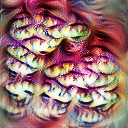

identical
512 1.804757



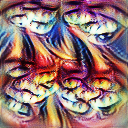

512 1.5645862



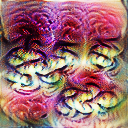

512 1.6122255



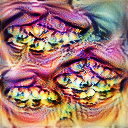

512 4.226666



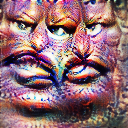

512 3.9457393



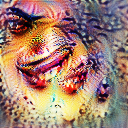

512 4.041715



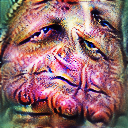

512 6.997851



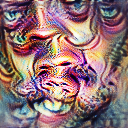

512 6.8421288



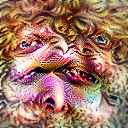

512 11.818171



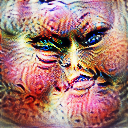

512 7.263136



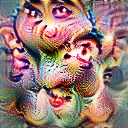

512 6.638654



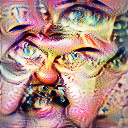

512 9.256175



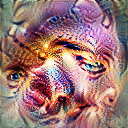

512 10.599524



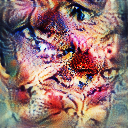

512 7.0452576



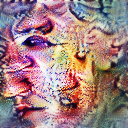

512 11.637546



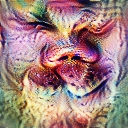

512 0.7567243



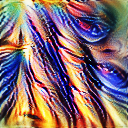

512 1.5724559



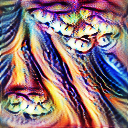

identical
512 0.9570821



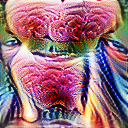

512 1.2959896



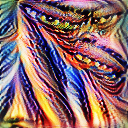

512 4.6175394



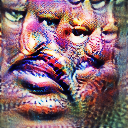

512 4.5207005



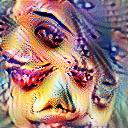

512 5.335207



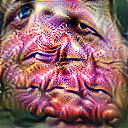

512 7.1471066



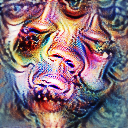

512 6.333887



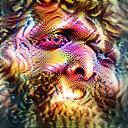

512 11.046588



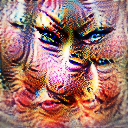

512 5.66419



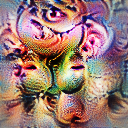

512 6.8984127



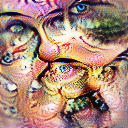

512 6.918088



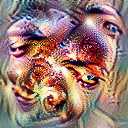

512 10.89529



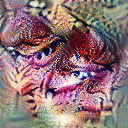

512 6.6640744



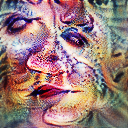

512 5.6759324



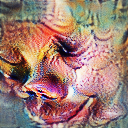

512 0.7584588



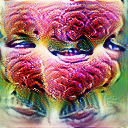

512 1.636061



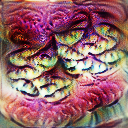

512 1.0347863



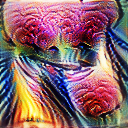

identical
512 1.2727822



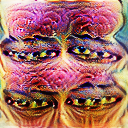

512 6.7730956



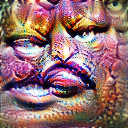

512 3.4621937



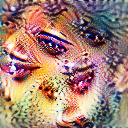

512 6.0438623



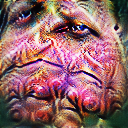

512 4.383147



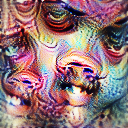

512 7.4014816



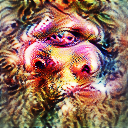

512 8.249212



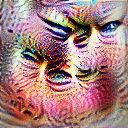

512 6.5914354



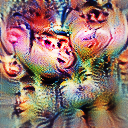

512 6.295208



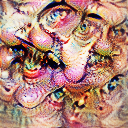

512 8.931084



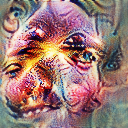

512 10.687867



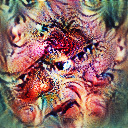

512 9.293547



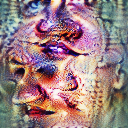

512 7.3246746



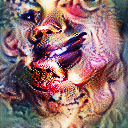

512 0.86076224



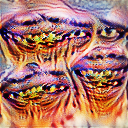

512 2.048123



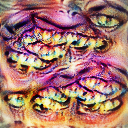

512 1.0038416



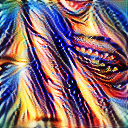

512 1.1237056



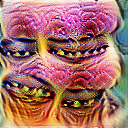

identical
512 4.376431



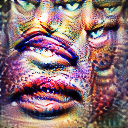

512 2.9706945



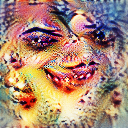

512 5.2913957



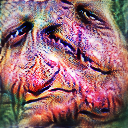

512 5.1129885



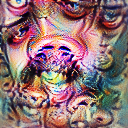

512 10.321736



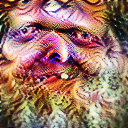

512 12.458458



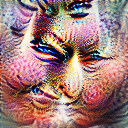

512 7.355414



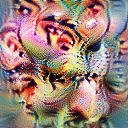

512 8.6304455



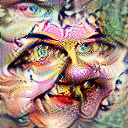

512 6.2639647



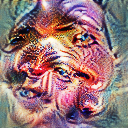

512 10.478548



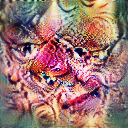

512 6.892099



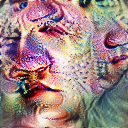

512 12.436882



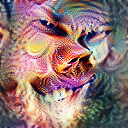

512 4.37659



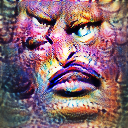

512 7.0279374



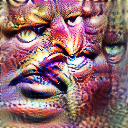

512 4.3347106



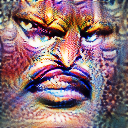

512 7.0711346



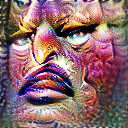

512 4.2712



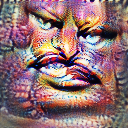

identical
512 6.7902



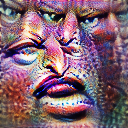

512 8.838331



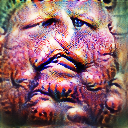

512 4.474859



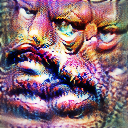

512 7.5054617



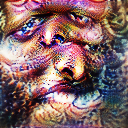

512 10.966579



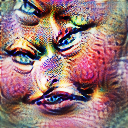

512 8.335555



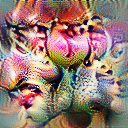

512 8.234556



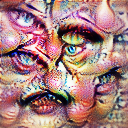

512 6.032896



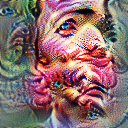

512 9.443688



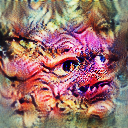

512 10.399843



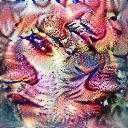

512 6.3815517



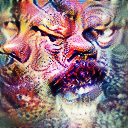

512 3.1073847



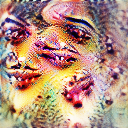

512 2.053771



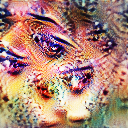

512 3.0417335



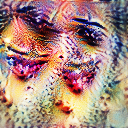

512 2.8501348



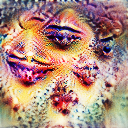

512 2.719815



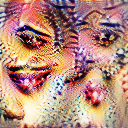

512 6.3114095



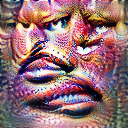

identical
512 4.0914855



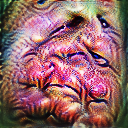

512 5.8988943



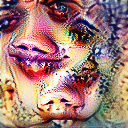

512 11.117517



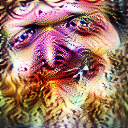

512 8.897852



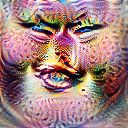

512 7.2241454



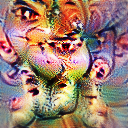

512 6.691046



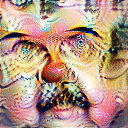

512 7.4269447



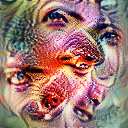

512 7.2416363



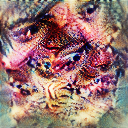

512 11.1238365



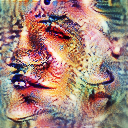

512 6.5589175



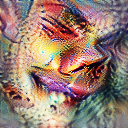

512 4.1452136



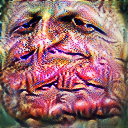

512 4.276609



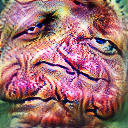

512 5.3982735



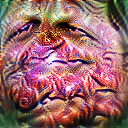

512 4.974912



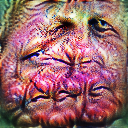

512 4.284727



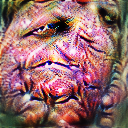

512 6.455778



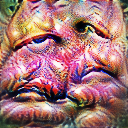

512 4.001186



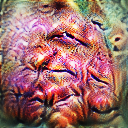

identical
512 5.186283



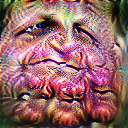

512 13.810963



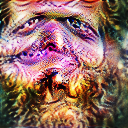

512 10.233474



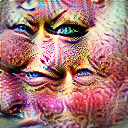

512 7.0261493



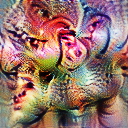

512 7.4828215



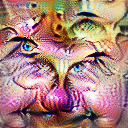

512 6.721135



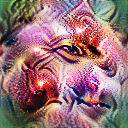

512 8.1108265



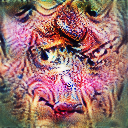

512 9.727263



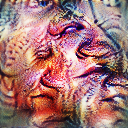

512 6.336733



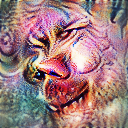

512 6.257535



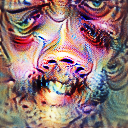

512 6.63552



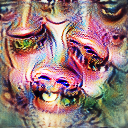

512 4.2978034



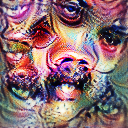

512 4.9580054



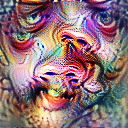

512 7.3495154



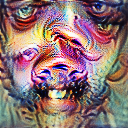

512 4.470701



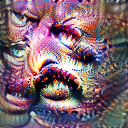

512 5.3302965



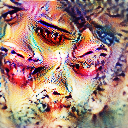

512 4.8627543



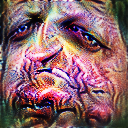

identical
512 6.9186473



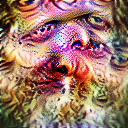

512 11.141596



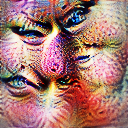

512 7.214989



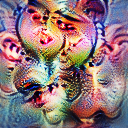

512 9.47705



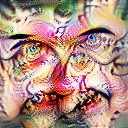

512 11.769066



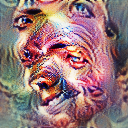

512 5.4313416



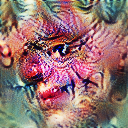

512 6.624132



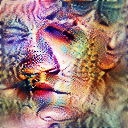

512 13.999165



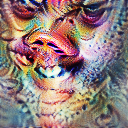

512 7.022189



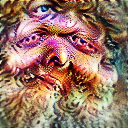

512 8.073397



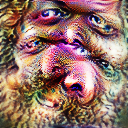

512 9.747913



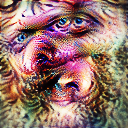

512 9.954178



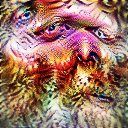

512 7.3584867



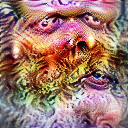

512 7.178818



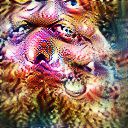

512 7.4951587



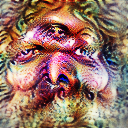

512 8.938665



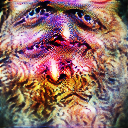

512 7.177999



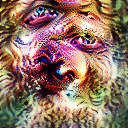

identical
512 11.710293



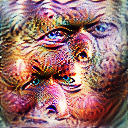

512 13.778903



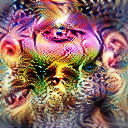

512 8.331957



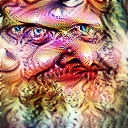

512 8.076777



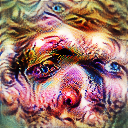

512 12.174612



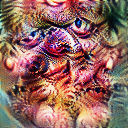

512 10.65552



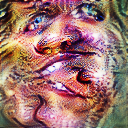

512 7.6609974



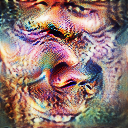

512 8.644787



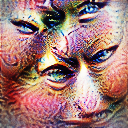

512 7.9582806



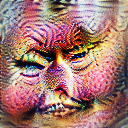

512 12.309821



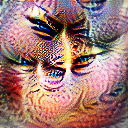

512 8.639054



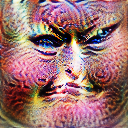

512 10.356694



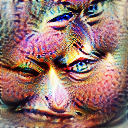

512 15.491819



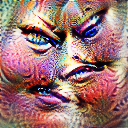

512 11.96422



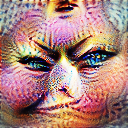

512 11.8031845



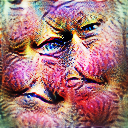

512 11.476341



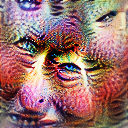

512 17.9442



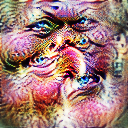

identical
512 14.389235



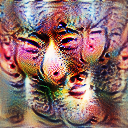

512 9.552699



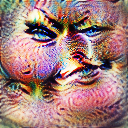

512 15.988603



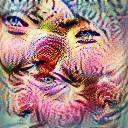

512 10.045209



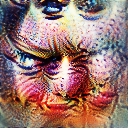

512 8.028204



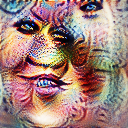

512 11.458935



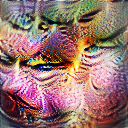

512 9.033066



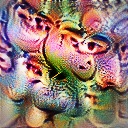

512 10.586365



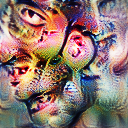

512 5.9152393



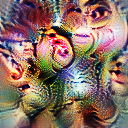

512 9.008937



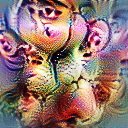

512 8.552628



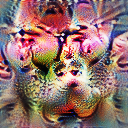

512 7.461879



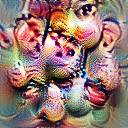

512 10.08364



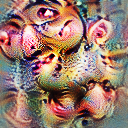

512 8.014775



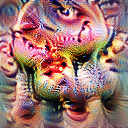

512 7.2632394



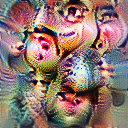

512 9.937718



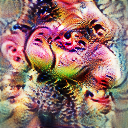

512 11.653273



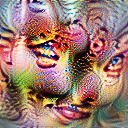

identical
512 7.949834



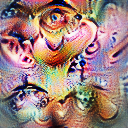

512 11.953825



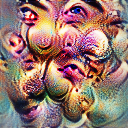

512 9.537521



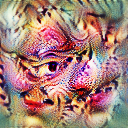

512 7.795067



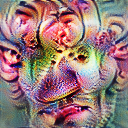

512 9.967434



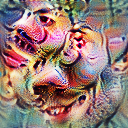

512 6.8792934



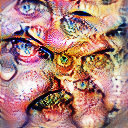

512 9.5007925



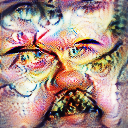

512 6.0516787



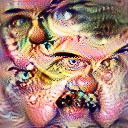

512 7.281123



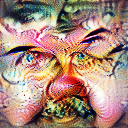

512 9.109964



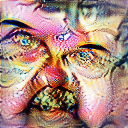

512 8.327394



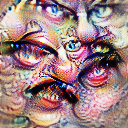

512 7.782282



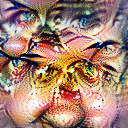

512 8.189715



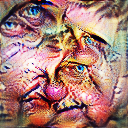

512 8.260627



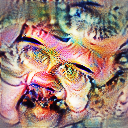

512 9.398338



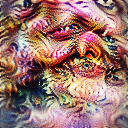

512 11.150711



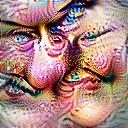

512 8.867501



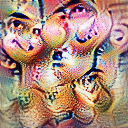

identical
512 7.0158424



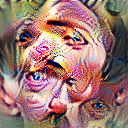

512 15.101598



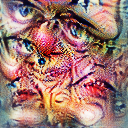

512 14.290741



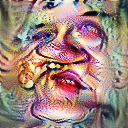

512 9.694195



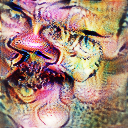

512 6.237047



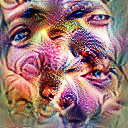

512 5.8085146



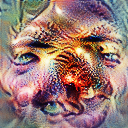

512 6.636198



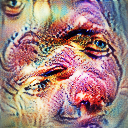

512 9.570971



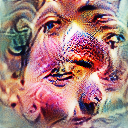

512 6.690318



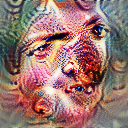

512 6.7590914



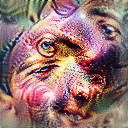

512 10.108697



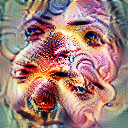

512 10.799946



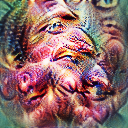

512 8.117534



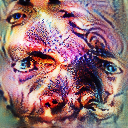

512 10.554828



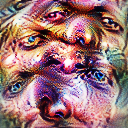

512 11.069741



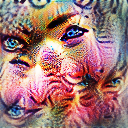

512 14.534269



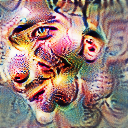

512 10.59845



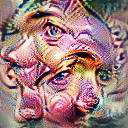

identical
512 10.311436



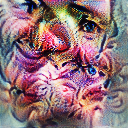

512 8.916386



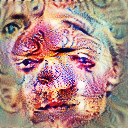

512 9.443329



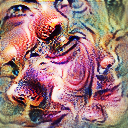

512 7.4789267



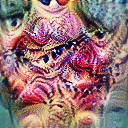

512 11.164425



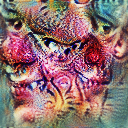

512 9.378623



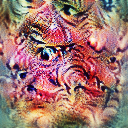

512 5.9561195



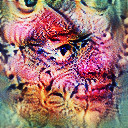

512 9.635224



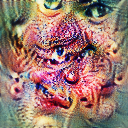

512 10.313044



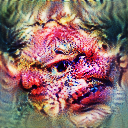

512 7.398424



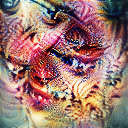

512 8.703185



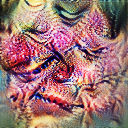

512 7.196692



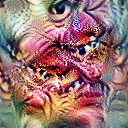

512 8.058855



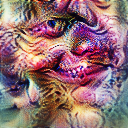

512 16.13795



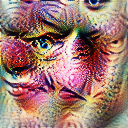

512 12.248625



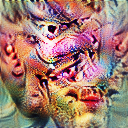

512 8.925588



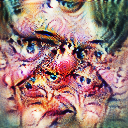

512 10.368011



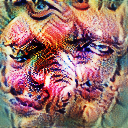

identical
512 9.822699



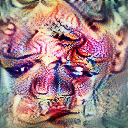

512 14.264757



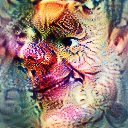

512 6.654106



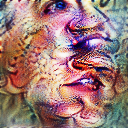

512 7.312742



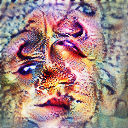

512 10.664031



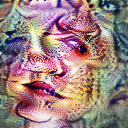

512 10.414379



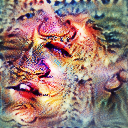

512 9.229853



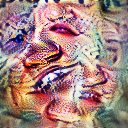

512 6.331058



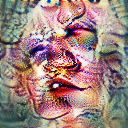

512 7.0657444



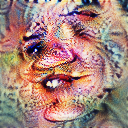

512 11.010417



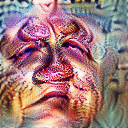

512 12.49527



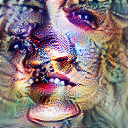

512 8.092745



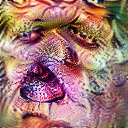

512 8.268787



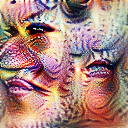

512 7.851494



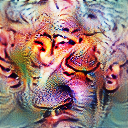

512 9.166044



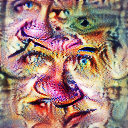

512 9.432448



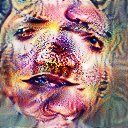

512 7.6687784



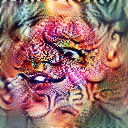

identical
512 7.9113903



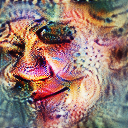

512 7.6910806



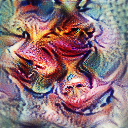

512 10.895368



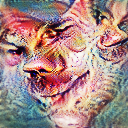

512 7.143956



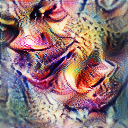

512 11.11487



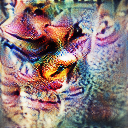

512 12.071727



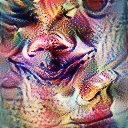

512 7.5021114



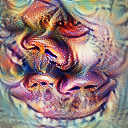

512 6.9671574



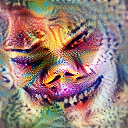

512 6.6571817



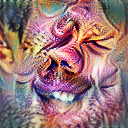

512 9.301578



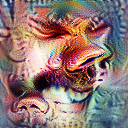

512 13.890357



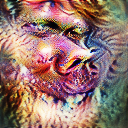

512 8.475283



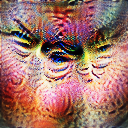

512 13.529641



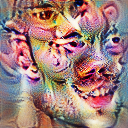

512 11.318416



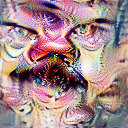

512 9.756746



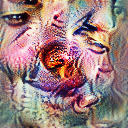

512 15.352748



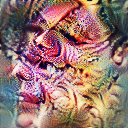

512 10.08038



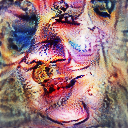

identical


In [ ]:
C = lambda neuron: objectives.channel(*neuron)
path = "/content/generated_images/"
for (name, unit) in neuronlist:
  fname = name + str(unit)
  fname_temp = fname.replace("/", "")
  indvidual = render.render_vis( facenet, C( (name, unit)))
  saving.save_img(indvidual[0], path + "individual/" +  fname_temp + ".png")
  for (name_2, unit_2) in neuronlist:
    if (name_2, unit_2) == (name, unit):
      print("identical")
      continue
    fname_2 = name_2 + str(unit_2)
    joint = render.render_vis(facenet, C((name_2, unit_2)) + C((name, unit)))
    flist = sorted([fname, fname_2])
    flist0_temp = flist[0].replace("/", "")
    flist1_temp = flist[1].replace("/", "")
    saving.save_img(joint[0], path + "joint/" + flist0_temp + "x" + flist1_temp + ".png")

In [ ]:
# Copy the files into google drive

!cp -r /content/generated_images/ /content/drive/MyDrive/deep_learning/gen/

Everything below this is not that relevant

512 375.26926



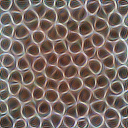

512 1360.7761



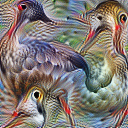

512 700.15344



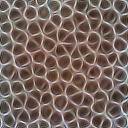

In [ ]:
C = lambda neuron: objectives.channel(*neuron)

_ = render.render_vis(model, C(neuron1))
_ = render.render_vis(model, C(neuron2))
output = render.render_vis(model, C(neuron1) + C(neuron1))

In [ ]:
saving.save_img(output[0], "adsfdasf.png")